In [ ]:
import os
import sys
import tarfile
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.initializers import HeNormal, GlorotUniform
from tensorflow.keras.applications import DenseNet121
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras import backend as K


tf.random.set_seed(123)

In [ ]:
print("GPU Available: ", tf.test.is_gpu_available())


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU Available:  True


In [ ]:
path = 'C:/Users/xlab-shared/Downloads/train/train/indoors'

In [ ]:
filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

In [ ]:
print(len(df))

4399


In [ ]:
from PIL import Image
image_path = df['image'][0]
image = Image.open(image_path)

# Convert the image to a NumPy array
image_array = np.array(image)

# Print the array
print(image_array.shape)

(768, 1024, 3)


In [ ]:
HEIGHT = 256
WIDTH = 256
LR = 0.0001
EPOCHS = 20
BATCH_SIZE = 32

In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=6, dim=(224, 224), n_channels=3, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map_path, mask_path):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map_path).squeeze()
        mask = np.load(mask_path)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)

        # Add a small value to depth map to avoid log(0)
        depth_map += 0.0001
        depth_map = np.log(depth_map)

        # Apply mask
        depth_map = np.ma.masked_where(~mask, depth_map)

        # Normalize the depth map
        depth_min = np.min(depth_map)
        depth_max = np.max(depth_map)
        depth_map = (depth_map - depth_min) / (depth_max - depth_min)

        depth_map = cv2.resize(depth_map.filled(fill_value=0), self.dim)  # Handle masked values
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map


    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        return x, y


In [ ]:
from skimage.io import imsave
from skimage import img_as_ubyte
from matplotlib import cm

(6, 256, 256, 3)


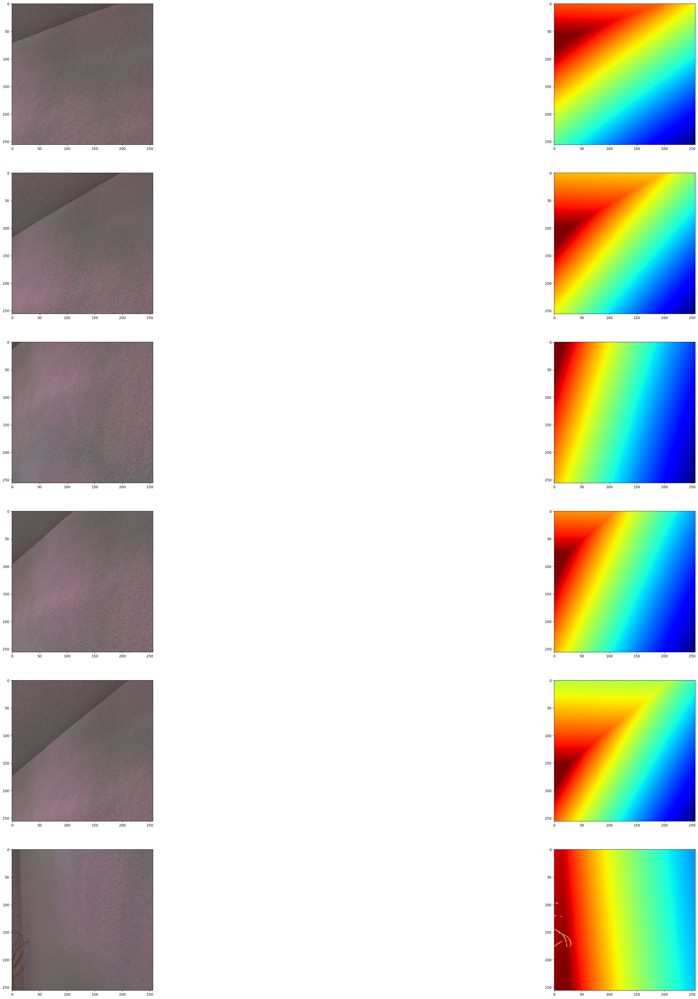

In [ ]:
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    print(input.shape)
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        # transformed_pred = (pred + 1) / 2

        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)
            output_directory = '/'
            prediction_filename = f"prediction_{i}.png"
            pred_image_to_save = img_as_ubyte(pred[i].squeeze())
            imsave(prediction_filename, pred_image_to_save, cmap=cm.get_cmap(cmap))


    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)
visualize_depth_map(visualize_samples)

In [ ]:
temp = next(iter(DataGenerator(data=df, batch_size=1, dim=(HEIGHT, WIDTH))))
input, target = temp

# Find the maximum value in the input and target
max_input = tf.reduce_max(input)
max_target = tf.reduce_max(target)

min_input = tf.reduce_min(input)
min_target = tf.reduce_min(target)

# Print the maximum values
print("Maximum value in input:", max_input.numpy())
print("Maximum value in target:", max_target.numpy())
print("Minimum value in input:", min_input.numpy())
print("Minimum value in target:", min_target.numpy())



Maximum value in input: 0.6313725709915161
Maximum value in target: 1.0
Minimum value in input: 0.21568629145622253
Minimum value in target: 0.0003212640294805169


In [ ]:
from tensorflow.keras.applications import VGG16

In [ ]:
class DownscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding, kernel_regularizer=tf.keras.regularizers.l2(0.01),kernel_initializer=HeNormal())
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding, kernel_regularizer=tf.keras.regularizers.l2(0.01),kernel_initializer=HeNormal())
        self.reluA = layers.LeakyReLU()
        self.reluB = layers.LeakyReLU()
        self.bn2a = tf.keras.layers.BatchNormalization(epsilon=1e-5)
        self.bn2b = tf.keras.layers.BatchNormalization(epsilon=1e-5)

        self.pool = layers.MaxPool2D((2, 2), (2, 2))

    def call(self, input_tensor):
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        x += d
        p = self.pool(x)
        return x, p


class UpscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding, kernel_regularizer=tf.keras.regularizers.l2(0.01),kernel_initializer=HeNormal())
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding, kernel_regularizer=tf.keras.regularizers.l2(0.01),kernel_initializer=HeNormal())
        self.reluA = layers.LeakyReLU()
        self.reluB = layers.LeakyReLU()
        self.bn2a = tf.keras.layers.BatchNormalization(epsilon=1e-5)
        self.bn2b = tf.keras.layers.BatchNormalization(epsilon=1e-5)
        self.conc = layers.Concatenate()

    def call(self, x, skip):
        x = self.us(x)
        concat = self.conc([x, skip])
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x


class BottleNeckBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding, kernel_regularizer=tf.keras.regularizers.l2(0.01),kernel_initializer=HeNormal())
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding, kernel_regularizer=tf.keras.regularizers.l2(0.01),kernel_initializer=HeNormal())
        self.reluA = layers.LeakyReLU()
        self.reluB = layers.LeakyReLU()

    def call(self, x):
        x = self.convA(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.reluB(x)
        return x


In [ ]:
class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.9
        self.l1_loss_weight = 0.25
        self.edge_loss_weight = 0.6

        self.loss_metric = tf.keras.metrics.Mean(name="loss")
        self.ssim_loss_metric = tf.keras.metrics.Mean(name='ssim_loss')
        self.l1_loss_metric = tf.keras.metrics.Mean(name='l1_loss')
        self.edge_loss_metric = tf.keras.metrics.Mean(name='edge_loss')


        f = [16, 32, 64, 128, 256]
        backbone = VGG16(weights = 'imagenet',include_top=False)
        backbone.trainable = False
        backbone_layers = ['block1_conv1', 'block1_conv2', 'block2_conv1', 'block2_conv2', 'block3_conv1', 'block3_conv2', 'block4_conv1', 'block4_conv2',]
        self.pool = layers.MaxPool2D((2, 2), (2, 2))


        ##for backbone as decoder
        self.downscale_blocks = []
        num_blocks = 4
        k = 0
        for i in range(num_blocks):
          current_block = Sequential()
          for j in range(2):
            layer_name = backbone_layers[2*i + j]
            current_block.add(backbone.get_layer(layer_name))
          self.downscale_blocks.append(current_block)

        self.bottle_neck_block = BottleNeckBlock(f[4])
        self.upscale_blocks = [
            UpscaleBlock(f[3]),
            UpscaleBlock(f[2]),
            UpscaleBlock(f[1]),
            UpscaleBlock(f[0]),
        ]
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01 ** 2, k2=0.03 ** 2
            )
        )
        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))
        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss,self.ssim_loss_weight * ssim_loss,self.l1_loss_weight * l1_loss,self.edge_loss_weight * depth_smoothness_loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data

        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss,ssim,l1,edge = self.calculate_loss(target, pred)
        trainable_vars = self.trainable_variables
        # for layer in self.backbone_layers:
        #     if isinstance(layer, tf.keras.layers.Layer):
        #         trainable_vars += layer.trainable_variables

        gradients = tape.gradient(loss, trainable_vars)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        self.ssim_loss_metric.update_state(ssim)
        self.l1_loss_metric.update_state(l1)
        self.edge_loss_metric.update_state(ssim)

        return {
            "loss": self.loss_metric.result(),
            "ssim": self.ssim_loss_metric.result(),
            "l1": self.l1_loss_metric.result(),
            "edge": self.edge_loss_metric.result()
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss,ssim,l1,edge = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        self.ssim_loss_metric.update_state(ssim)
        self.l1_loss_metric.update_state(l1)
        self.edge_loss_metric.update_state(ssim)
        return {
            "loss": self.loss_metric.result(),
            "ssim": self.ssim_loss_metric.result(),
            "l1": self.l1_loss_metric.result(),
            "edge": self.edge_loss_metric.result()
        }

    def call(self, x):
        #c1, c2, c3, c4 = [backbone(x) for backbone in self.backbone_layers]
        c1 = self.downscale_blocks[0](x)
        p1 = self.pool(c1)
        c2 = self.downscale_blocks[1](p1)
        p2 = self.pool(c2)
        c3 = self.downscale_blocks[2](p2)
        p3 = self.pool(c3)
        c4 = self.downscale_blocks[3](p3)
        p4 = self.pool(c4)
        # c1, p1 = self.downscale_blocks[0](x)
        # c2, p2 = self.downscale_blocks[1](p1)
        # c3, p3 = self.downscale_blocks[2](p2)
        # c4, p4 = self.downscale_blocks[3](p3)

        bn = self.bottle_neck_block(p4)

        u1 = self.upscale_blocks[0](bn, c4)
        u2 = self.upscale_blocks[1](u1, c3)
        u3 = self.upscale_blocks[2](u2, c2)
        u4 = self.upscale_blocks[3](u3, c1)

        return self.conv_layer(u4)


In [ ]:
def lr_scheduler(epoch):
  lr_ini = 0.001
  drop = 0.5
  epoch_drop = 5
  lr = lr_ini * drop**((epoch + 1)//epoch_drop)
  return lr

lr = LearningRateScheduler(lr_scheduler)

from tensorflow.keras.models import Sequential
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=False, clipvalue=1.0
)

model = DepthEstimationModel()
# Compile the model
model.compile(optimizer)

train_loader = DataGenerator(
    data=df[:3520].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[3520:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
model.fit(
    train_loader,
    epochs=20,
    validation_data=validation_loader,
    callbacks = [lr]
)

Epoch 1/20
110/110 [==============================] - 224s 2s/step - loss: 0.1538 - ssim: 0.1082 - l1: 0.0555 - edge: 0.1082 - val_loss: 0.4761 - val_ssim: 0.1469 - val_l1: 0.0601 - val_edge: 0.1469 - lr: 0.0010
Epoch 2/20
110/110 [==============================] - 214s 2s/step - loss: 0.1230 - ssim: 0.1290 - l1: 0.0563 - edge: 0.1290 - val_loss: 0.2039 - val_ssim: 0.1194 - val_l1: 0.0540 - val_edge: 0.1194 - lr: 0.0010
Epoch 3/20
110/110 [==============================] - 216s 2s/step - loss: 0.1201 - ssim: 0.1127 - l1: 0.0524 - edge: 0.1127 - val_loss: 0.1413 - val_ssim: 0.1038 - val_l1: 0.0504 - val_edge: 0.1038 - lr: 0.0010
Epoch 4/20
110/110 [==============================] - 218s 2s/step - loss: 0.1188 - ssim: 0.1006 - l1: 0.0497 - edge: 0.1006 - val_loss: 0.1423 - val_ssim: 0.0967 - val_l1: 0.0488 - val_edge: 0.0967 - lr: 0.0010
Epoch 5/20
110/110 [==============================] - 215s 2s/step - loss: 0.1172 - ssim: 0.0951 - l1: 0.0484 - edge: 0.0951 - val_loss: 0.1262 - val_ss

(6, 256, 256, 3)
1/1 [==============================] - 0s 292ms/step


C:\Users\xlab-shared\AppData\Local\Temp\ipykernel_22820\141468862.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  imsave(prediction_filename, pred_image_to_save, cmap=cm.get_cmap(cmap))


(6, 256, 256, 3)
1/1 [==============================] - 0s 20ms/step


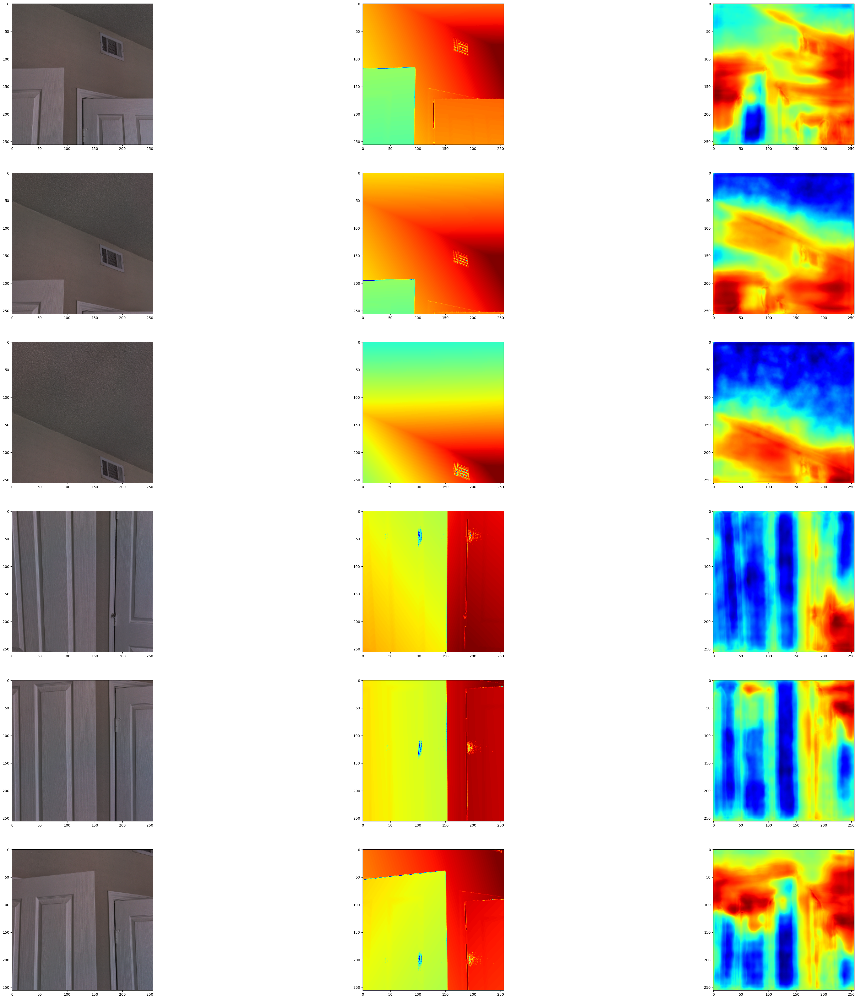

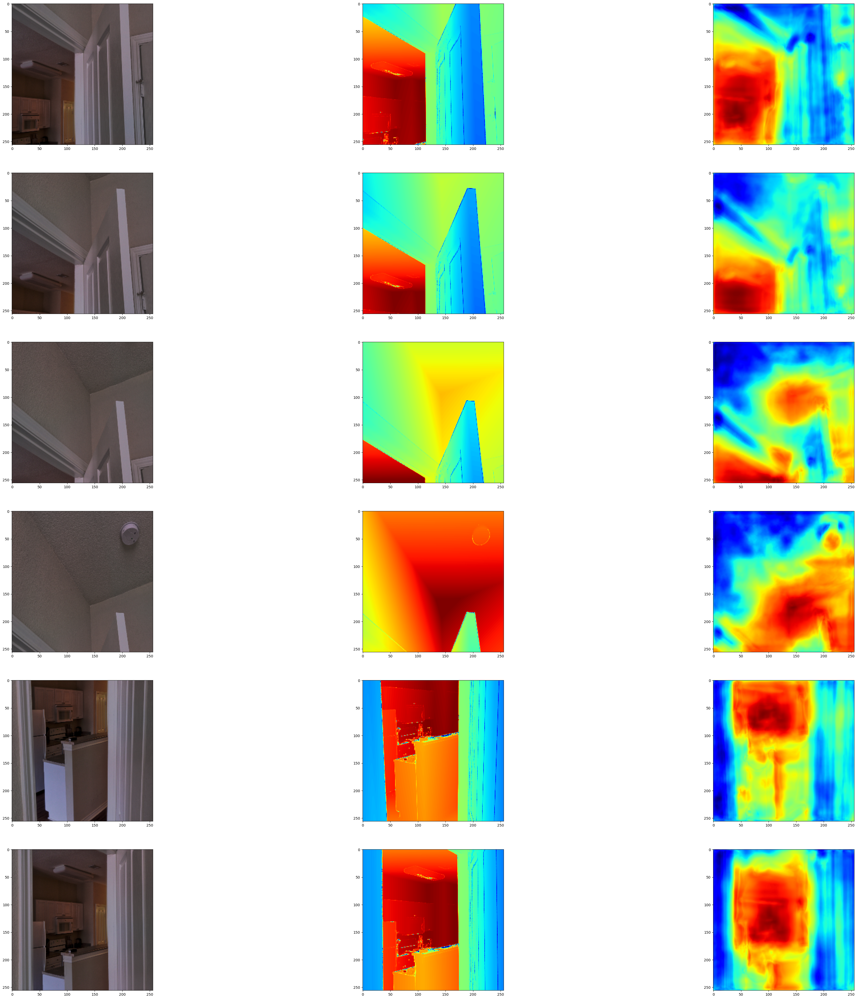

In [ ]:
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )

    )
)
visualize_depth_map(test_loader, test=True, model=model)